In [328]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

In [329]:
df = pd.read_csv('../../.data/id_dates_posts-profile.txt', 
                 sep=' ', 
                 names=['id', 'date'], 
                 index_col='id', parse_dates=['date'], infer_datetime_format='%d.%m.%Y')

In [350]:
print('Records:', df.size)

Records: 116595


In [270]:
df = df[df.date < datetime(year=2013, month=1, day=1)]

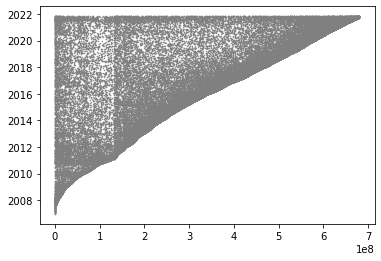

In [331]:
condition = df.date.apply(lambda x: x.day != 26 and x.day > 12)
filtered_df = df[condition]
plt.scatter(x=df.index[condition], y=df.date[condition], marker='.', s=1, c='grey')

In [332]:
df = filtered_df

In [334]:
precentile_low = [df.date.iloc[0]]
for i in range(1, df.size):
    precentile_low.append(
        np.quantile(df.date[max(0, i - 300):i], 0.2)
    )


In [274]:
# df[df.date == df.date[df.index > 140000000].min()]

#

In [333]:
fig = px.scatter(df)
fig.update_traces(marker={'size': 2})

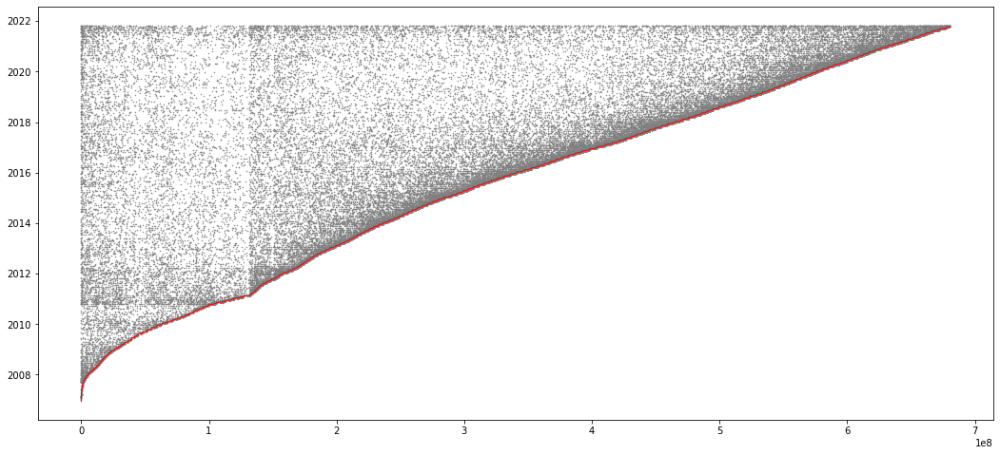

In [338]:
plt.figure(figsize=(18, 8))
plt.scatter(x=df.index, y=df.date, marker='.', s=1, c='grey')
plt.plot(np.minimum.accumulate(df.date[::-1]), c='red', linewidth=1)
#plt.plot(df.index, precentile_low, c='green')
plt.show()

In [327]:
##df.index[np.searchsorted(df.index, 245089915)]
df.index[-1]
245089915

245089915

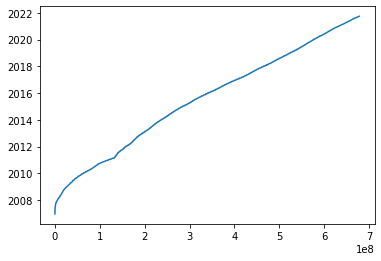

In [346]:
plt.plot(np.minimum.accumulate(df.date[::-1])[::-1][::100])

In [349]:
np.minimum.accumulate(df.date[::-1])[::-1][::100].to_csv('id-date.csv')